Задача: Классификация

Датасет: Музыка 1950-2019. Этот набор данных содержит список песен с 1950 по 2019 год, описывающих музыкальные метаданные как грусть, танцевальность, громкость, акустику и т.д..

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap

Данные в датасете:

In [3]:
data = pd.read_csv('/content/tcc_ceds_music.csv', index_col="release_date", on_bad_lines='skip')
dataset = pd.read_csv('/content/tcc_ceds_music.csv', on_bad_lines='skip')
mus_data = pd.read_csv('/content/tcc_ceds_music.csv', index_col="topic", on_bad_lines='skip')
dataset.head()

,Unnamed: 0,artist_name,track_name,release_date,genre,lyrics,len,dating,violence,world/life,...,sadness,feelings,danceability,loudness,acousticness,instrumentalness,valence,energy,topic,age
0,0,mukesh,mohabbat bhi jhoothi,1950,pop,hold time feel break feel untrue convince spea...,95,0.000598,0.063746,0.000598,...,0.380299,0.117175,0.357739,0.454119,0.997992,0.901822,0.339448,0.137110,sadness,1.0
1,4,frankie laine,i believe,1950,pop,believe drop rain fall grow believe darkest ni...,51,0.035537,0.096777,0.443435,...,0.001284,0.001284,0.331745,0.647540,0.954819,0.000002,0.325021,0.263240,world/life,1.0
2,6,johnnie ray,cry,1950,pop,sweetheart send letter goodbye secret feel bet...,24,0.002770,0.002770,0.002770,...,0.002770,0.225422,0.456298,0.585288,0.840361,0.000000,0.351814,0.139112,music,1.0
3,10,pérez prado,patricia,1950,pop,kiss lips want stroll charm mambo chacha merin...,54,0.048249,0.001548,0.001548,...,0.225889,0.001548,0.686992,0.744404,0.083935,0.199393,0.775350,0.743736,romantic,1.0
4,12,giorgos papadopoulos,apopse eida oneiro,1950,pop,till darling till matter know till dream live ...,48,0.001350,0.001350,0.417772,...,0.068800,0.001350,0.291671,0.646489,0.975904,0.000246,0.597073,0.394375,romantic,1.0


Размер датасета:

In [4]:
dataset.shape

(15392, 31)

Датасет имеет 30 признаков и состоит из 28 тысяч песен.

Формат данных для каждого признака:

In [5]:
dataset.dtypes

Unnamed: 0                    int64
artist_name                  object
track_name                   object
release_date                  int64
genre                        object
lyrics                       object
len                           int64
dating                      float64
violence                    float64
world/life                  float64
night/time                  float64
shake the audience          float64
family/gospel               float64
romantic                    float64
communication               float64
obscene                     float64
music                       float64
movement/places             float64
light/visual perceptions    float64
family/spiritual            float64
like/girls                  float64
sadness                     float64
feelings                    float64
danceability                float64
loudness                    float64
acousticness                float64
instrumentalness            float64
valence                     

Какие существуют признаки в датасете:

In [6]:
dataset.columns

Index(['Unnamed: 0', 'artist_name', 'track_name', 'release_date', 'genre',
       'lyrics', 'len', 'dating', 'violence', 'world/life', 'night/time',
       'shake the audience', 'family/gospel', 'romantic', 'communication',
       'obscene', 'music', 'movement/places', 'light/visual perceptions',
       'family/spiritual', 'like/girls', 'sadness', 'feelings', 'danceability',
       'loudness', 'acousticness', 'instrumentalness', 'valence', 'energy',
       'topic', 'age'],
      dtype='object')

Распределение значений по столбцам:

In [7]:
dataset.describe()

,Unnamed: 0,release_date,len,dating,violence,world/life,night/time,shake the audience,family/gospel,romantic,...,like/girls,sadness,feelings,danceability,loudness,acousticness,instrumentalness,valence,energy,age
count,15392.000000,15392.000000,15392.000000,15392.000000,15392.000000,15392.000000,15392.000000,15392.000000,15391.000000,15391.000000,...,15391.000000,15391.000000,15391.000000,15391.000000,15391.000000,1.539100e+04,15391.000000,15391.000000,15391.000000,15391.000000
mean,23260.400598,1985.333615,70.257471,0.023924,0.095846,0.119593,0.059805,0.016305,0.018534,0.055078,...,0.029361,0.145106,0.032314,0.523174,0.655394,3.809101e-01,0.043443,0.539466,0.540228,0.495247
std,14218.527172,17.589287,39.417514,0.056506,0.161738,0.171665,0.113476,0.038392,0.044618,0.110709,...,0.059868,0.188257,0.073155,0.156297,0.104490,3.245145e-01,0.148561,0.245352,0.238889,0.251279
min,0.000000,1950.000000,2.000000,0.000292,0.000292,0.000292,0.000289,0.000306,0.000289,0.000292,...,0.000289,0.000292,0.000289,0.021878,0.155680,3.714863e-07,0.000000,0.010305,0.007056,0.014286
25%,11247.500000,1971.000000,42.000000,0.000957,0.001053,0.001120,0.001053,0.000993,0.000940,0.000993,...,0.000975,0.001196,0.001012,0.418932,0.587057,6.244886e-02,0.000000,0.338417,0.346326,0.300000
50%,21858.500000,1984.000000,61.000000,0.001504,0.001949,0.003759,0.001949,0.001504,0.001504,0.001880,...,0.001595,0.039076,0.001754,0.532113,0.662282,3.112443e-01,0.000026,0.543487,0.536522,0.514286
75%,34997.250000,1999.000000,88.000000,0.010864,0.124207,0.196898,0.071074,0.005263,0.005848,0.054439,...,0.031468,0.306328,0.035269,0.633922,0.736431,6.817266e-01,0.002247,0.740313,0.735227,0.700000
max,49296.000000,2019.000000,199.000000,0.647706,0.968689,0.962105,0.950139,0.465331,0.545303,0.837529,...,0.532070,0.939148,0.820967,0.987003,0.964541,1.000000e+00,0.984818,0.996908,0.998999,1.000000


Смотрим, есть ли отсутствующие значения:

In [8]:
dataset.isna().sum()

Unnamed: 0                  0
artist_name                 0
track_name                  0
release_date                0
genre                       0
lyrics                      0
len                         0
dating                      0
violence                    0
world/life                  0
night/time                  0
shake the audience          0
family/gospel               1
romantic                    1
communication               1
obscene                     1
music                       1
movement/places             1
light/visual perceptions    1
family/spiritual            1
like/girls                  1
sadness                     1
feelings                    1
danceability                1
loudness                    1
acousticness                1
instrumentalness            1
valence                     1
energy                      1
topic                       1
age                         1
dtype: int64

График, показывающий изменение энергичности песен с течением времени:

<Figure size 1152x432 with 0 Axes>

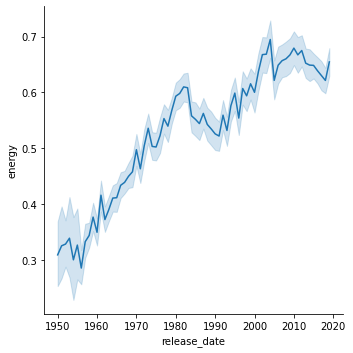

In [10]:
plt.figure(figsize=(16,6))
sns.relplot(x="release_date", y="energy", kind="line", data=dataset);

In [11]:
def memory_analyse(df):
    for dtype in ['float','int','object']:
        selected_dtype = df.select_dtypes(include=[dtype])
        mean_usage_b = selected_dtype.memory_usage(deep=True).mean()
        mean_usage_mb = mean_usage_b / 1024 ** 2
        print("Average memory usage for {} columns: {:03.2f} MB".format(dtype,mean_usage_mb))

memory_analyse(dataset)

Average memory usage for float columns: 0.11 MB
Average memory usage for int columns: 0.09 MB
Average memory usage for object columns: 1.85 MB


Зависимость тематики трека от его длины.

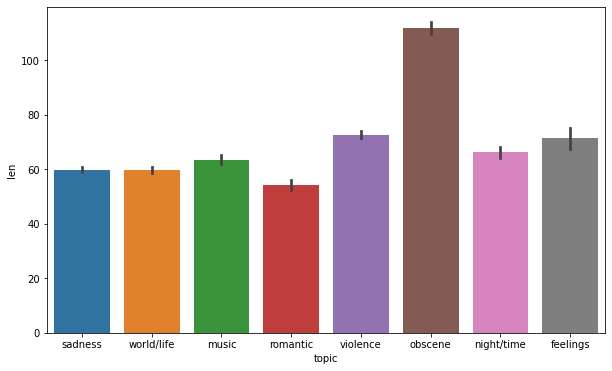

In [14]:
plt.figure(figsize=(10,6))
sns.barplot(x=mus_data.index, y=mus_data['len'])

Зависимость тематики от энергичности

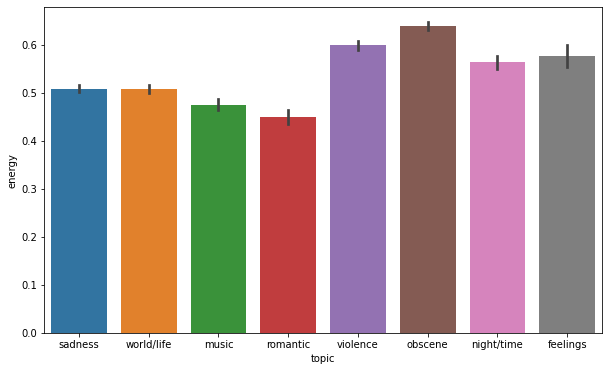

In [13]:
plt.figure(figsize=(10,6))
sns.barplot(x=mus_data.index, y=mus_data['energy'])

Зависимость тематики от романтичности

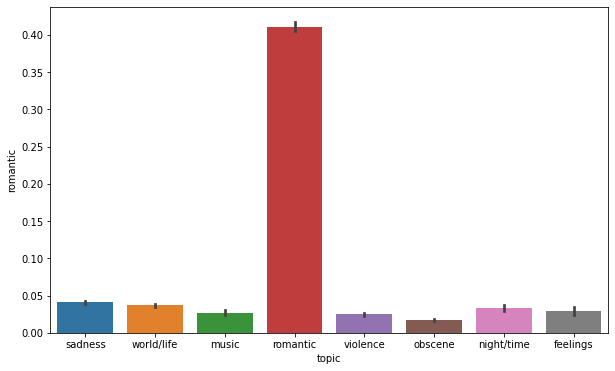

In [15]:
plt.figure(figsize=(10,6))
sns.barplot(x=mus_data.index, y=mus_data['romantic'])

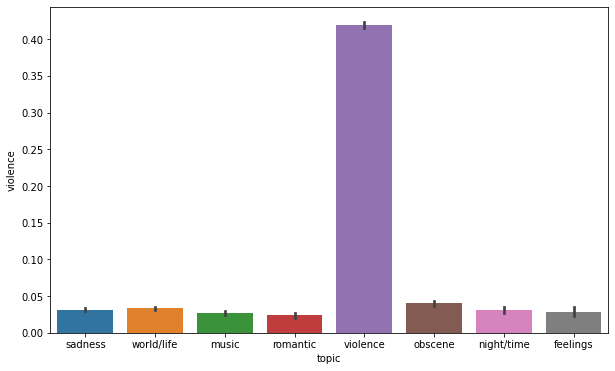

In [16]:
plt.figure(figsize=(10,6))
sns.barplot(x=mus_data.index, y=mus_data['violence'])

In [17]:
cols = ['len', 'dating', 'violence', 'world/life', 'night/time',
       'shake the audience', 'family/gospel', 'romantic', 'communication',
       'obscene', 'music', 'movement/places', 'light/visual perceptions',
       'family/spiritual', 'like/girls', 'sadness', 'feelings', 'danceability',
       'loudness', 'acousticness', 'instrumentalness', 'valence', 'energy', 'age']

Распределение значений для каждого признака

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

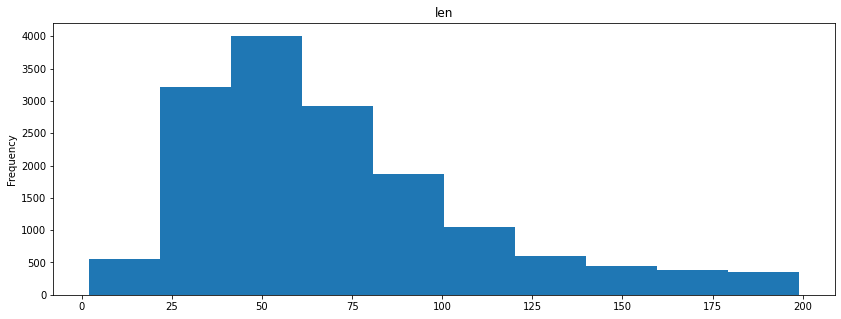

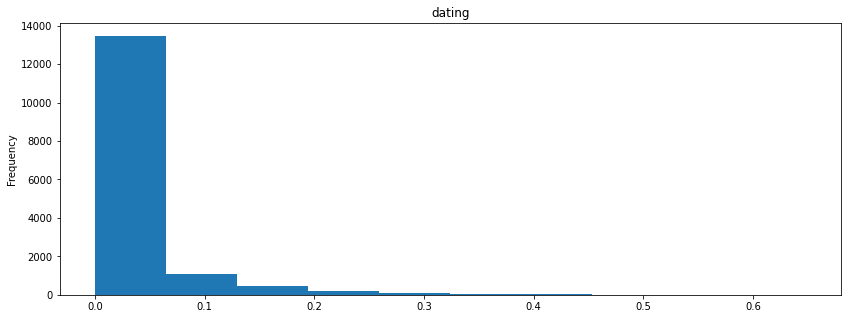

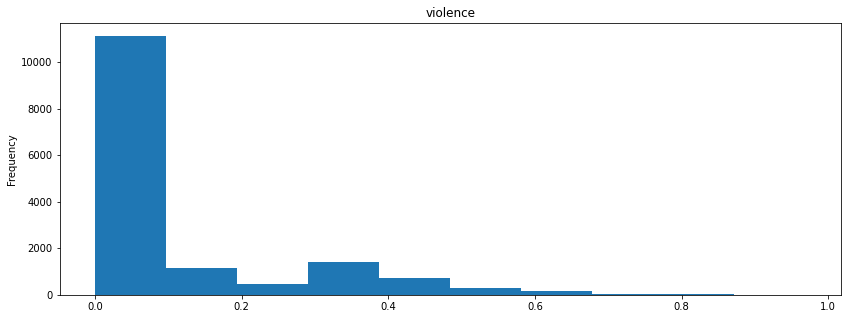

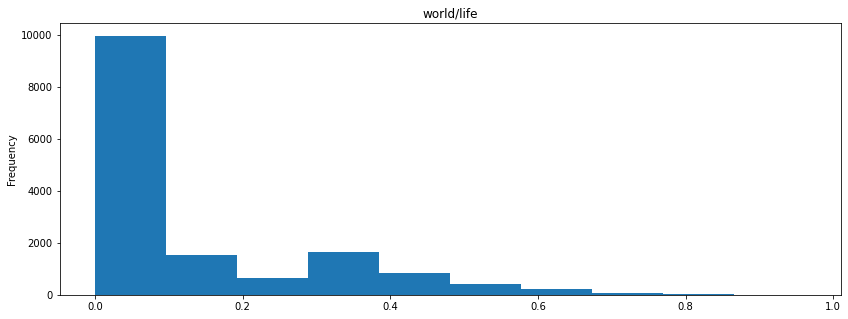

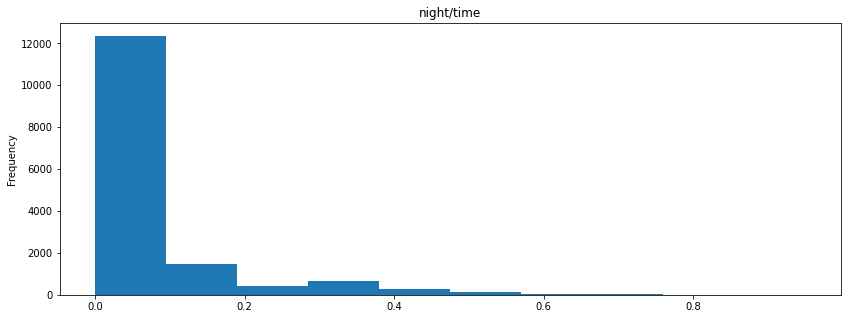

...

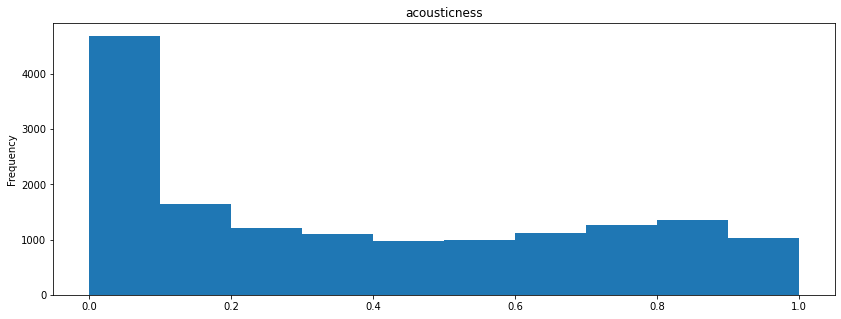

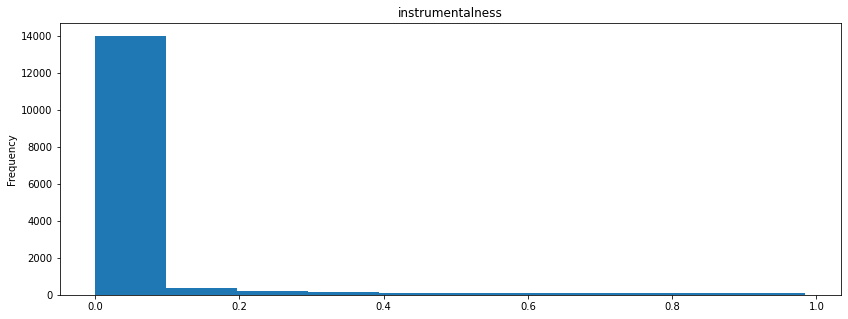

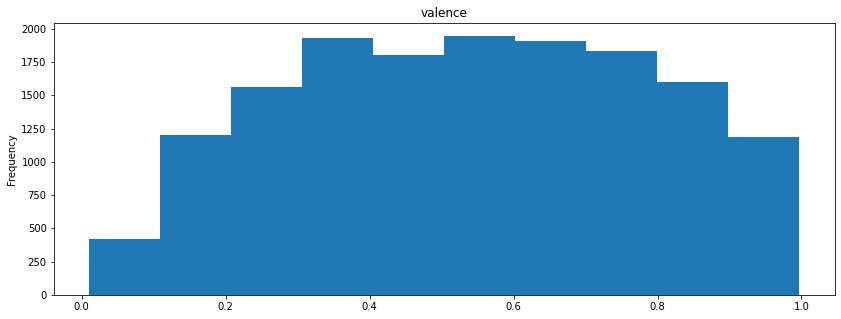

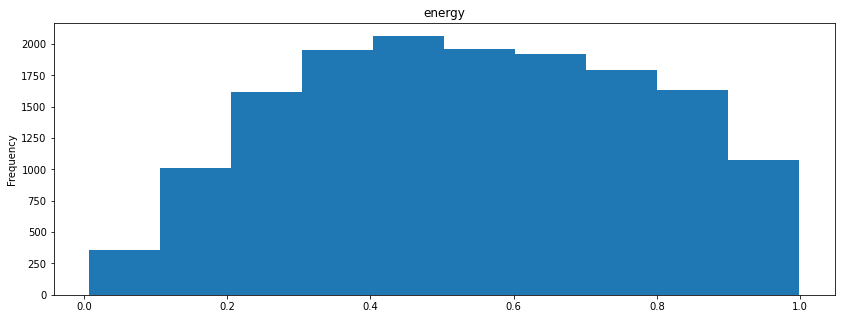

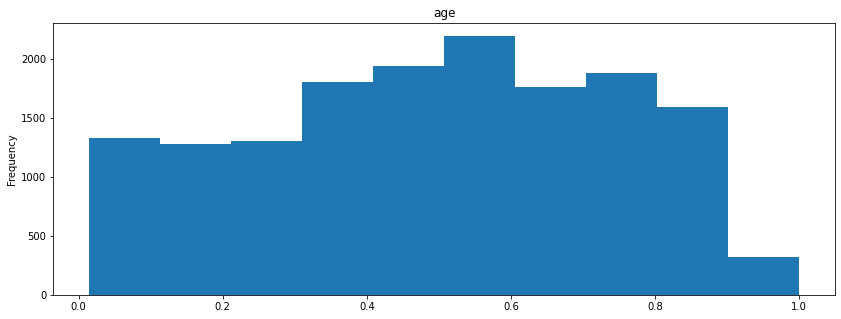

In [18]:
for col in cols:
    fig = plt.figure(figsize=(14,5))
    plt.title(col)
    dataset[col].plot.hist(bins=10)

Корреляция

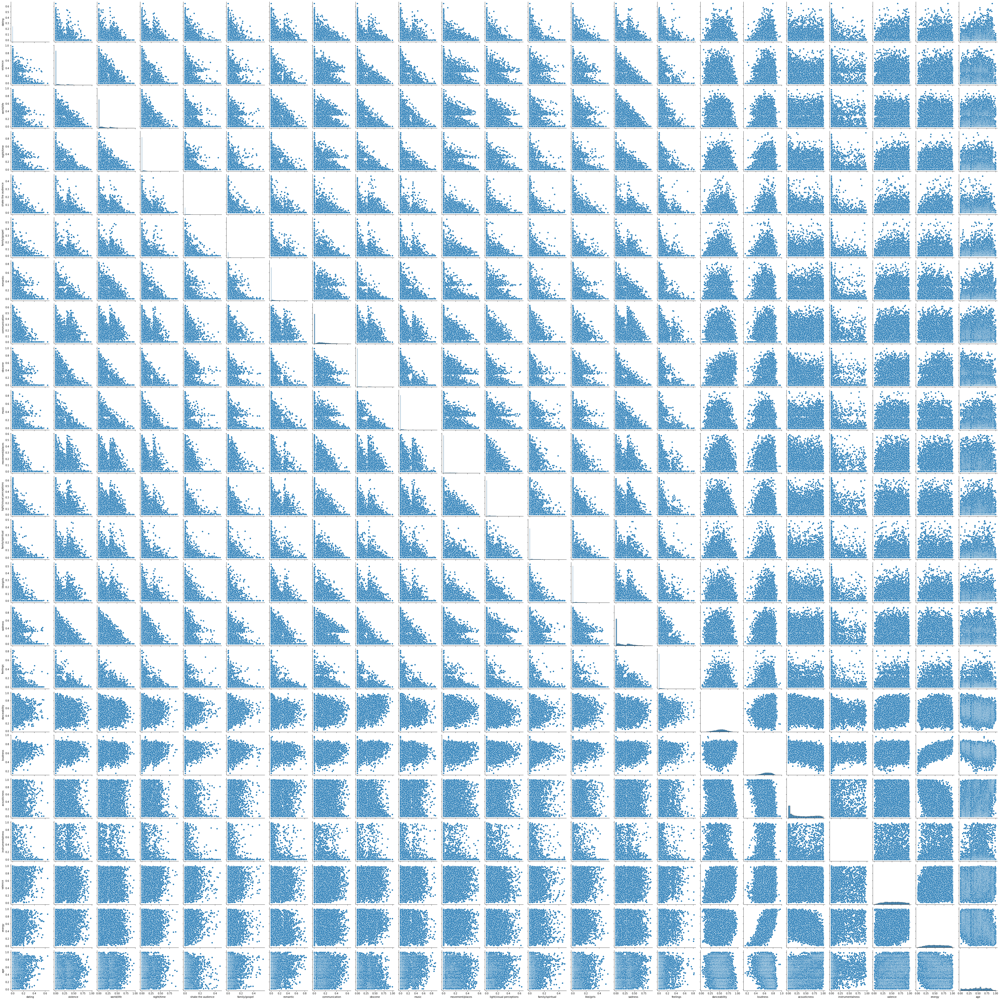

In [19]:
cols1 = ['dating', 'violence', 'world/life', 'night/time',
       'shake the audience', 'family/gospel', 'romantic', 'communication',
       'obscene', 'music', 'movement/places', 'light/visual perceptions',
       'family/spiritual', 'like/girls', 'sadness', 'feelings', 'danceability',
       'loudness', 'acousticness', 'instrumentalness', 'valence', 'energy', 'age']

sns_plot = sns.pairplot(dataset[cols1].dropna())

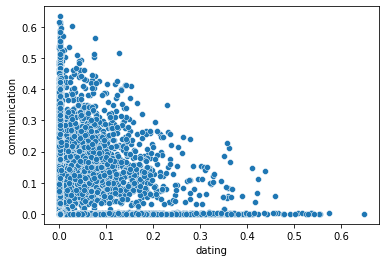

In [20]:
sns.scatterplot(x=dataset['dating'], y=dataset['communication'])

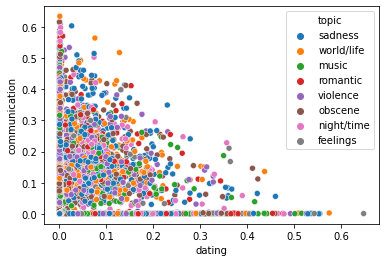

In [22]:
sns.scatterplot(x=dataset['dating'], y=dataset['communication'], hue=dataset['topic'])

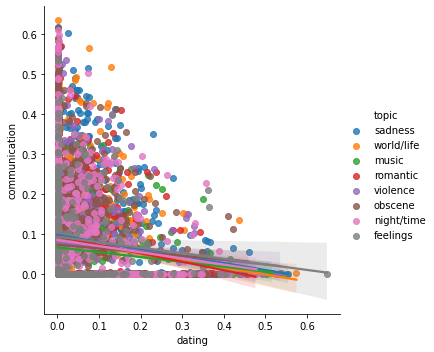

In [23]:
sns.lmplot(x='dating', y='communication', hue='topic', data=dataset)

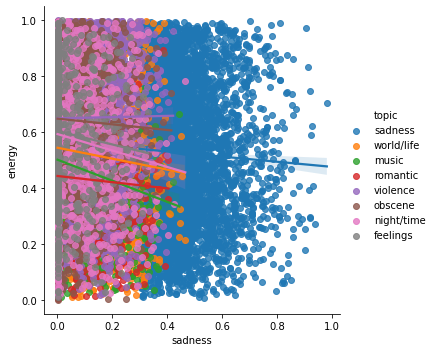

In [ ]:
sns.lmplot(x='sadness', y='energy', hue='topic', data=dataset)

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


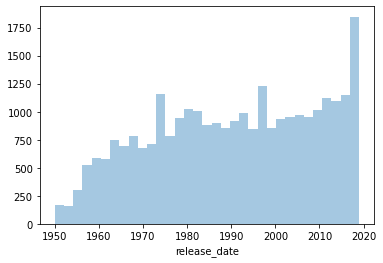

In [ ]:
sns.distplot(a=dataset['release_date'], label='romantic', kde=False)

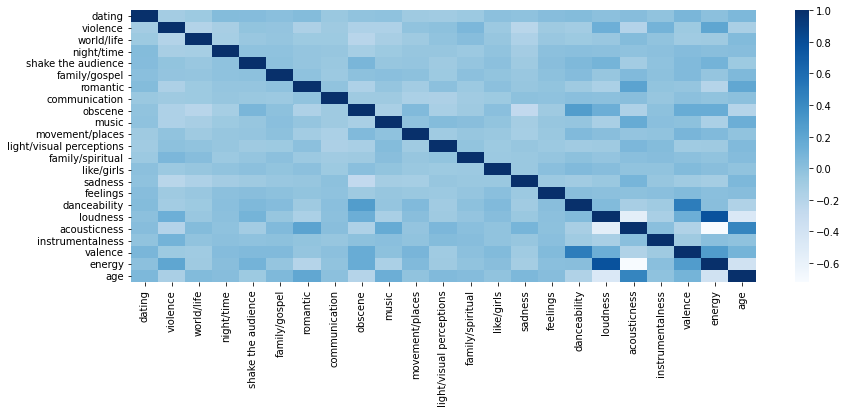

In [ ]:
fig = plt.figure(figsize= (14,5))
sns.heatmap(dataset[cols1].dropna().corr(), cmap = 'Blues')

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


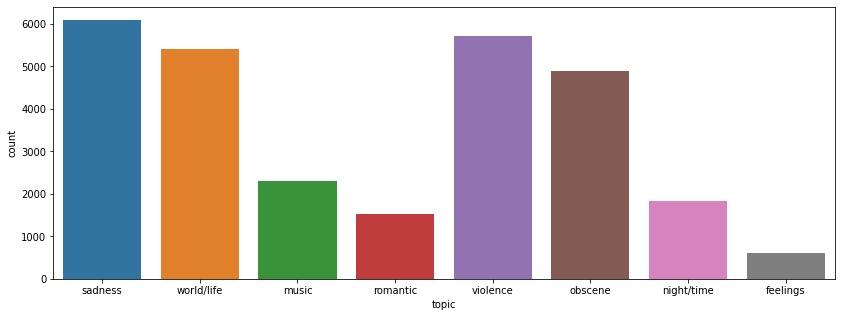

In [ ]:
fig = plt.figure(figsize= (14,5))
sns.countplot(dataset['topic'])

In [ ]:
unique_counts = pd.DataFrame.from_records([(col, dataset[col].dtype, dataset[col].nunique()) for col in dataset.columns],
                          columns=['Column_Name', 'Type', 'Num_Unique']).sort_values(by=['Num_Unique'])
unique_counts

,Column_Name,Type,Num_Unique
4,genre,object,7
29,topic,object,8
30,age,float64,70
3,release_date,int64,70
6,len,int64,199
23,danceability,float64,859
27,valence,float64,1295
28,energy,float64,1348
25,acousticness,float64,3786
26,instrumentalness,float64,4939


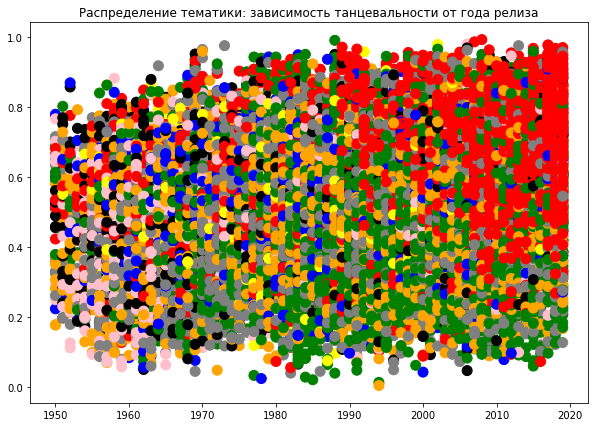

In [ ]:
dataset.topic.replace(['sadness', 'music', 'romantic', 'feelings', 'world/life', 'violence', 'obscene', 'night/time'], [1.0, 0.8571, 0.7143, 0.5714, 0.4286, 0.2857, 0.1429, 0.0], inplace=True)

colors = ListedColormap(["blue", "red", "green", "gray", "yellow", "pink", "black", "orange"])
plt.figure(figsize=(10,7))
plt.title("Распределение тематики: зависимость танцевальности от года релиза")
plt.scatter(dataset['release_date'], dataset['danceability'], c=dataset['topic'], cmap=colors, s=100)
plt.show()

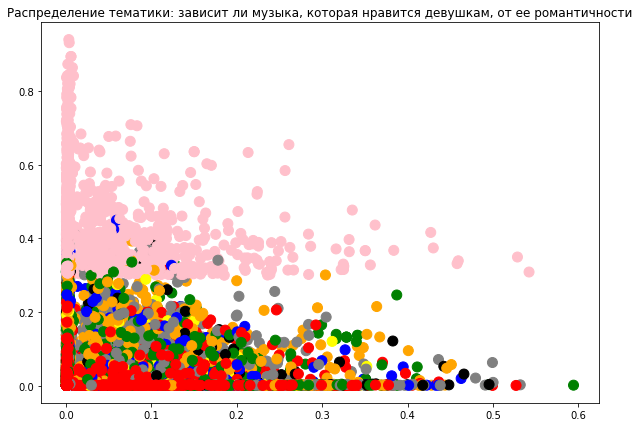

In [ ]:
colors = ListedColormap(["blue", "red", "green", "gray", "yellow", "pink", "black", "orange"])
plt.figure(figsize=(10,7))
plt.title("Распределение тематики: зависит ли музыка, которая нравится девушкам, от ее романтичности")
plt.scatter(dataset['like/girls'], dataset['romantic'], c=dataset['topic'], cmap=colors, s=100)
plt.show()